# Comparing Machine Learning Algorithms for Alzheimer's Disease Classification

### Initial Data Fetching and Cleaning 



### Setting up to use Kaggle API

In order to retrieve dataset via API, user needs to (1) create a Kaggle account, (2) go to 'Account', and (3) click on 'Create New Token' under the API section. A json file containing your username and API key will download.

Copy this json file into the directory containing this notebook. For your reference, there is an empty one as an example.

If you have any issues, see here for more info: https://github.com/Kaggle/kaggle-api/blob/main/docs/README.md

When downloading the dataset files from Kaggle, may happen that you would receive an SSL error message. This may happen if you are working on corporate-managed device, and throws a certificatie verification error. If you have trouble fetching, you can just skip to reading in copy from data/source.

In [3]:
# Import other libraries first
import pandas as pd
import os
import json

# Install kaggle first using pip (exact method varies depending on set up)
!pip3 install kaggle

# Open the file and load the data
with open('kaggle.json', 'r') as file:
    data = json.load(file)

# Extract username and key
username = data.get('username')
key = data.get('key')

# Set username and key as environment variables
os.environ['KAGGLE_USERNAME'] = username
os.environ['KAGGLE_KEY'] = key

# Now you should be able to import kaggle
import kaggle

In [4]:
# Authenticate (uses username and key) and download dataset (set unzip to True)
kaggle.api.authenticate()

# Downloads to 'source' directory
kaggle.api.dataset_download_files('rabieelkharoua/alzheimers-disease-dataset', path='data/source', unzip=True)

Dataset URL: https://www.kaggle.com/datasets/rabieelkharoua/alzheimers-disease-dataset


In [5]:
# Read in downloaded data using pandas and print out
import pandas as pd
data = pd.read_csv('data/source/alzheimers_disease_data.csv')
print(data)

      PatientID  Age  Gender  Ethnicity  EducationLevel        BMI  Smoking  \
0          4751   73       0          0               2  22.927749        0   
1          4752   89       0          0               0  26.827681        0   
2          4753   73       0          3               1  17.795882        0   
3          4754   74       1          0               1  33.800817        1   
4          4755   89       0          0               0  20.716974        0   
...         ...  ...     ...        ...             ...        ...      ...   
2144       6895   61       0          0               1  39.121757        0   
2145       6896   75       0          0               2  17.857903        0   
2146       6897   77       0          0               1  15.476479        0   
2147       6898   78       1          3               1  15.299911        0   
2148       6899   72       0          0               2  33.289738        0   

      AlcoholConsumption  PhysicalActivity  DietQua

In [6]:
# Print out head
data.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid


In [7]:
# Describe data
data.describe()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
count,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,...,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000
mean,5825.000000,74.908795,0.506282,0.697534,1.286645,27.655697,0.288506,10.039442,4.920202,4.993138,...,5.080055,0.208004,0.156817,4.982958,0.205212,0.158213,0.150768,0.158678,0.301536,0.353653
std,620.507185,8.990221,0.500077,0.996128,0.904527,7.217438,0.453173,5.757910,2.857191,2.909055,...,2.892743,0.405974,0.363713,2.949775,0.403950,0.365026,0.357906,0.365461,0.459032,0.478214
min,4751.000000,60.000000,0.000000,0.000000,0.000000,15.008851,0.000000,0.002003,0.003616,0.009385,...,0.000460,0.000000,0.000000,0.001288,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5288.000000,67.000000,0.000000,0.000000,1.000000,21.611408,0.000000,5.139810,2.570626,2.458455,...,2.566281,0.000000,0.000000,2.342836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5825.000000,75.000000,1.000000,0.000000,1.000000,27.823924,0.000000,9.934412,4.766424,5.076087,...,5.094439,0.000000,0.000000,5.038973,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6362.000000,83.000000,1.000000,1.000000,2.000000,33.869778,1.000000,15.157931,7.427899,7.558625,...,7.546981,0.000000,0.000000,7.581490,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,6899.000000,90.000000,1.000000,3.000000,3.000000,39.992767,1.000000,19.989293,9.987429,9.998346,...,9.996467,1.000000,1.000000,9.999747,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Examination of the data

**1.** There are 35 (integer and float) variables in the original dataset.

**2.** For our model-centric approach to identify which machine learning model performs best when classifying Alzheimer’s diagnosis, we will use the below variables, total of 23 columns:
   
   *  **Demographics**
      * Id
      * Age
      * Gender
      * Ethnicity
      * Education level 

   * **Lifestyle Factors**
      * BMI
      * Smoking
      * Alcohol Consumption
      * Physical Activity
      * Diet Quality
      * Sleep Quality

   *  **Medical History**
      * Family History Alzheimers
      * Cardiovascular Disease
      * Diabetes
      * Depression
      * Head Injury
      * Hipertension

   * **Clinical Measurements**
      * SystolicBP
      * DiastolicBP
      * CholesterolTotal
      * Cholesterol ILDL
      * Cholesterol IHDL
      * Cholesterol Triglycerides

**3.** To compare the performance of the 23-variable model to the 9-variable model (based on prior work), we will use the below variables.
      * Education level
      * BMI
      * Smoking
      * Alcohol Consumption
      * Physical Activity
      * Depression
      * Head Injury
      * Diabetes
      * CholesterolTotal

**4.** Using 23-variable dataset, we have looked at:
      * Missing values
      * Outliers
      * Distributions

### Create 23-variable dataset

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [215]:
# Set list of columns that we want to keep for 23-variable model (23 predictors, 1 outcome)
# removed 'patient ID' because it doesn't contribute to the analysis. 
columns_to_keep_23 = ['Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides','Diagnosis']

# Create a new DataFrame with only those columns
data_23 = data[columns_to_keep_23]
data_23

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,...,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,Diagnosis
0,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,9.025679,...,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,0
1,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,7.151293,...,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,0
2,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,9.673574,...,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,0
3,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,8.392554,...,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,0
4,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,5.597238,...,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,7.535540,...,0,0,0,122,101,280.476824,94.870490,60.943092,234.520123,1
2145,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,8.555256,...,0,0,0,152,106,186.384436,95.410700,93.649735,367.986877,1
2146,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,5.769464,...,0,0,0,115,118,237.024558,156.267294,99.678209,294.802338,1
2147,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,8.322874,...,0,0,0,103,96,242.197192,52.482961,81.281111,145.253746,1


In [12]:
# Set list of columns that we want to keep for 9-variable model (9 predictors, 1 outcome)

columns_to_keep_9 = ['EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity',
       'Diabetes', 'Depression', 'HeadInjury', 'CholesterolTotal', 'Diagnosis']

# Create a new DataFrame with only those columns
data_9 = data[columns_to_keep_9]
data_9

,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,Diabetes,Depression,HeadInjury,CholesterolTotal,Diagnosis
0,2,22.927749,0,13.297218,6.327112,1,1,0,242.366840,0
1,0,26.827681,0,4.542524,7.619885,0,0,0,231.162595,0
2,1,17.795882,0,19.555085,7.844988,0,0,0,284.181858,0
3,1,33.800817,1,12.209266,8.428001,0,0,0,159.582240,0
4,0,20.716974,0,18.454356,6.310461,0,0,0,237.602184,0
...,...,...,...,...,...,...,...,...,...,...
2144,1,39.121757,0,1.561126,4.049964,0,0,0,280.476824,1
2145,2,17.857903,0,18.767261,1.360667,0,0,0,186.384436,1
2146,1,15.476479,0,4.594670,9.886002,0,0,0,237.024558,1
2147,1,15.299911,0,8.674505,6.354282,0,0,0,242.197192,1


In [13]:
len(data_9.columns)

10

### High level analysis identifying Missing Data & Adding default Values

We would use **`Missing Data Percentage List`** visualization, as we have wide features in our dataset and we want to analyse each of them. However, we see that there is not any missing values in our dataset:




In [15]:
percent_missing = data_23.isnull().sum() * 100 / len(data_23)
percent_missing

Age                         0.0
Gender                      0.0
Ethnicity                   0.0
EducationLevel              0.0
BMI                         0.0
Smoking                     0.0
AlcoholConsumption          0.0
PhysicalActivity            0.0
DietQuality                 0.0
SleepQuality                0.0
FamilyHistoryAlzheimers     0.0
CardiovascularDisease       0.0
Diabetes                    0.0
Depression                  0.0
HeadInjury                  0.0
Hypertension                0.0
SystolicBP                  0.0
DiastolicBP                 0.0
CholesterolTotal            0.0
CholesterolLDL              0.0
CholesterolHDL              0.0
CholesterolTriglycerides    0.0
Diagnosis                   0.0
dtype: float64

In [16]:
# Check shape
print(data_23.shape)

(2149, 23)


In [17]:
# Check shape of df when NAs are dropped
data_23.dropna().shape

(2149, 23)

### Checking the datatypes

In the source data, all of the features are numerical (int and float).

However, the following are categorical variables:
* Gender
* Ethnicity
* EducationLevel
* Smoking
* FamilyHistoryAlzheimers
* Diabetes
* CardiovascularDisease
* HeadInjury
* Depression
* Diagnosis

# !TO DO: Finish adding info on all categorical variables
Features Cardiovascular Disease, Diabetes, Depression, HeadInjury and Hypertension (all related with Medical History), have are binary ( where 0 indicates No and 1 indicates Yes). For Ethnicity, the information is classified as follows: 0 Caucasian, 1 African American, 2 Asian and 3 Other.


In [19]:
# Check data types
data_23.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       2149 non-null   int64  
 1   Gender                    2149 non-null   int64  
 2   Ethnicity                 2149 non-null   int64  
 3   EducationLevel            2149 non-null   int64  
 4   BMI                       2149 non-null   float64
 5   Smoking                   2149 non-null   int64  
 6   AlcoholConsumption        2149 non-null   float64
 7   PhysicalActivity          2149 non-null   float64
 8   DietQuality               2149 non-null   float64
 9   SleepQuality              2149 non-null   float64
 10  FamilyHistoryAlzheimers   2149 non-null   int64  
 11  CardiovascularDisease     2149 non-null   int64  
 12  Diabetes                  2149 non-null   int64  
 13  Depression                2149 non-null   int64  
 14  HeadInju

In [20]:
# Change data types to categorical
categorical_list = ['Gender', 'Ethnicity', 'EducationLevel',
       'Smoking', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Diagnosis']

for col in categorical_list:
    data_23[col] = data_23[col].astype('category')

data_23.info() # see they have changed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Age                       2149 non-null   int64   
 1   Gender                    2149 non-null   category
 2   Ethnicity                 2149 non-null   category
 3   EducationLevel            2149 non-null   category
 4   BMI                       2149 non-null   float64 
 5   Smoking                   2149 non-null   category
 6   AlcoholConsumption        2149 non-null   float64 
 7   PhysicalActivity          2149 non-null   float64 
 8   DietQuality               2149 non-null   float64 
 9   SleepQuality              2149 non-null   float64 
 10  FamilyHistoryAlzheimers   2149 non-null   category
 11  CardiovascularDisease     2149 non-null   category
 12  Diabetes                  2149 non-null   category
 13  Depression                2149 non-null   catego

C:\Users\wendy\AppData\Local\Temp\ipykernel_14720\794022384.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_23[col] = data_23[col].astype('category')


### Outliers 

The below code uses **`Box Plots`** to detect outliers for our numerical variables.


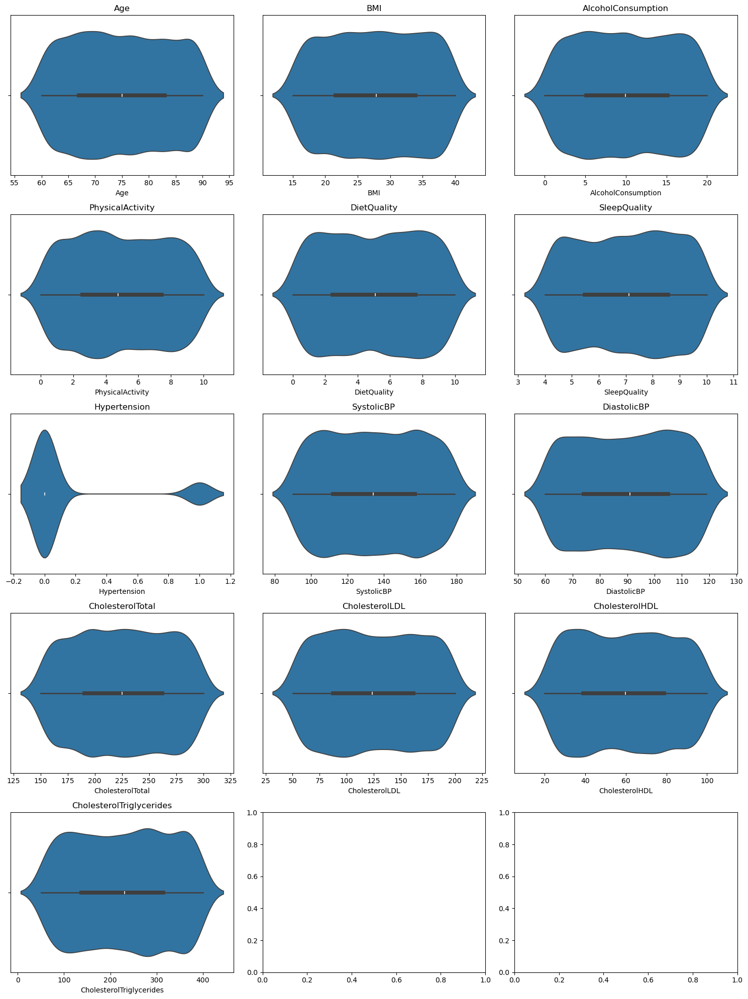

In [22]:
!pip3 install seaborn
import seaborn as sns
import matplotlib.pyplot as plt

features_of_interest = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
                        'SleepQuality', 'Hypertension', 'SystolicBP', 'DiastolicBP', 
                        'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 
                        'CholesterolTriglycerides']

# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20))  # Adjust the nrows and ncols to fit all plots

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop over the features and create a violin plot for each
for i, feature in enumerate(features_of_interest):
    sns.violinplot(x=data_23[feature], ax=axes[i])
    axes[i].set_title(feature)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

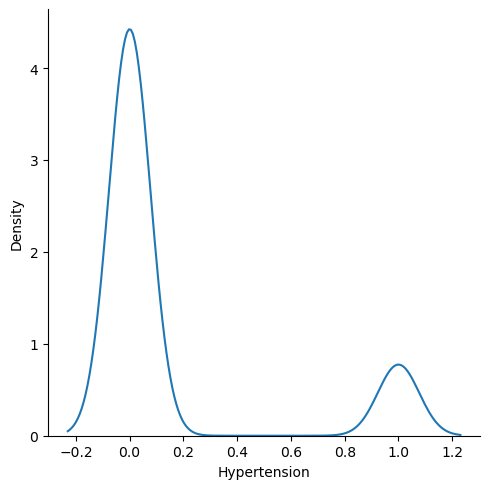

In [23]:
# Investigate hypertension
sns.displot(x = data_23['Hypertension'],kind="kde")

In [24]:
# Code to identify all Outliers (might not be needed; see plots above)
def find_outliers_iqr(data_23):
    Q1 = data_23.quantile(0.25)
    Q3 = data_23.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data_23[(data_23 < lower_bound) | (data_23 > upper_bound)]

for column in data_23.select_dtypes(include=['float64', 'int64']):
    outliers = find_outliers_iqr(data_23[column])
    if not outliers.empty:
        print(f"\nOutliers in '{column}':\n", outliers)
        


Outliers in 'Hypertension':
 8       1
11      1
15      1
17      1
30      1
       ..
2129    1
2133    1
2140    1
2142    1
2143    1
Name: Hypertension, Length: 320, dtype: int64


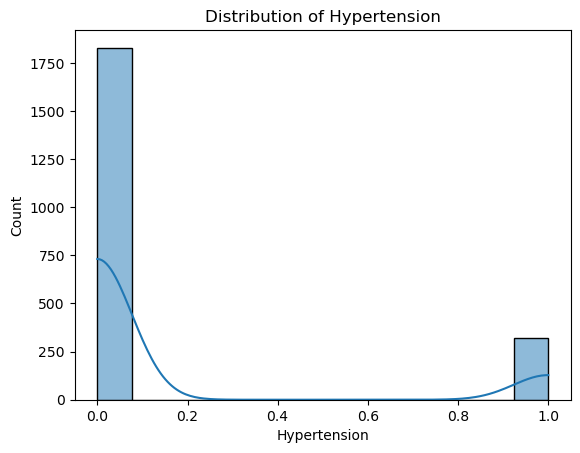

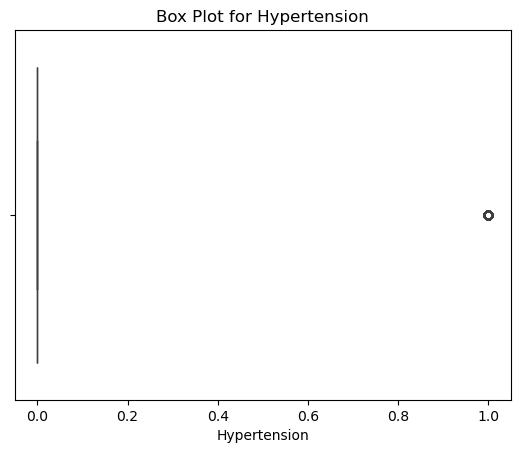

In [25]:
#INVESTIGATING HYPERTENSION 

# histogram to view distribution of hypertension
sns.histplot(data=data_23, x='Hypertension', kde=True)
plt.title('Distribution of Hypertension')
plt.show()

# Box Plot (for outliers)
sns.boxplot(data=data_23, x='Hypertension')
plt.title('Box Plot for Hypertension')
plt.show()


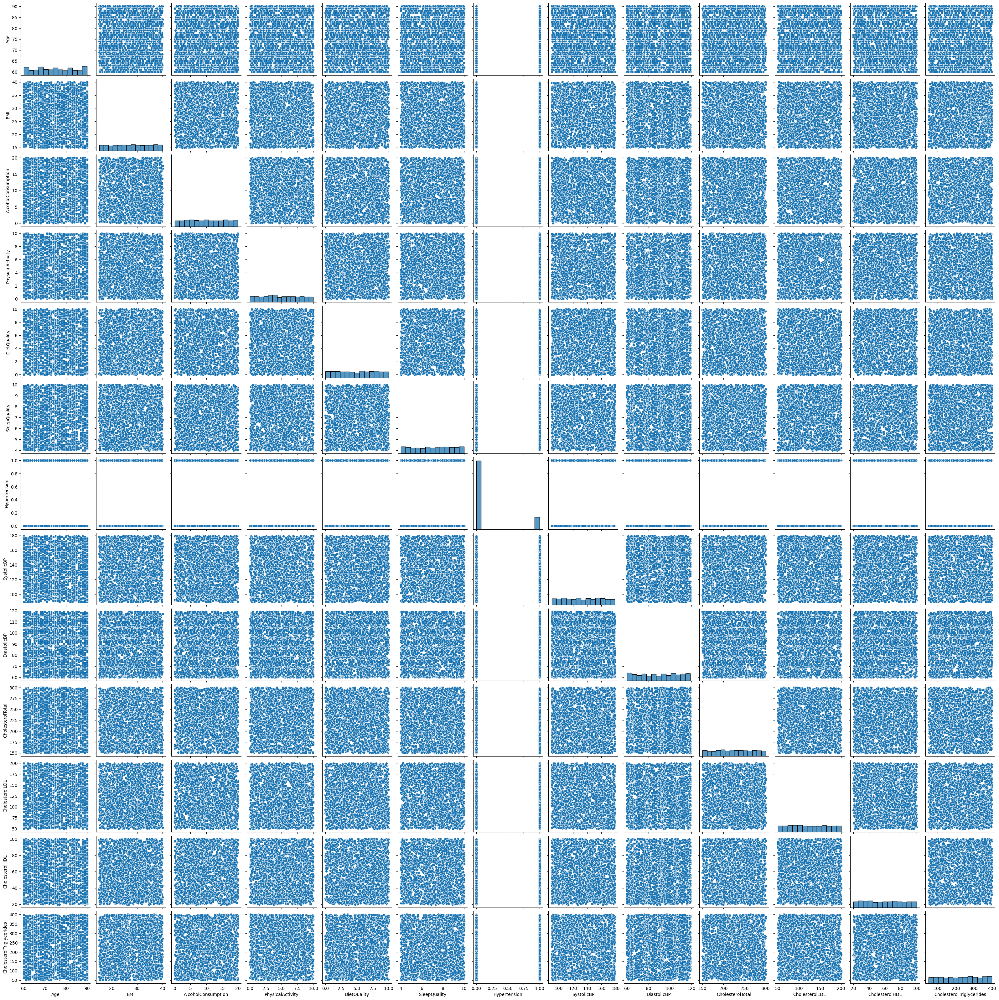

In [26]:
# TO DO: do this but by sub categories (e.g., lifestyle factors, demographics etc)
# At the moment, too many variables!
# https://seaborn.pydata.org/generated/seaborn.pairplot.html
sns.pairplot(data_23)


In [67]:
#categorical data
categorical_data_23_columns =['Gender', 'Ethnicity', 'EducationLevel',
       'Smoking', 'FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Hypertension',
       'Diabetes', 'Depression', 'HeadInjury', 'Diagnosis']

# Create a new DataFrame with only those columns
categorical_data_23 = data_23[categorical_data_23_column]
categorical_data_23

,Gender,Ethnicity,EducationLevel,Smoking,FamilyHistoryAlzheimers,CardiovascularDisease,Hypertension,Diabetes,Depression,HeadInjury,Diagnosis
0,0,0,2,0,0,0,0,1,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0
2,0,3,1,0,1,0,0,0,0,0,0
3,1,0,1,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2144,0,0,1,0,0,0,0,0,0,0,1
2145,0,0,2,0,0,0,0,0,0,0,1
2146,0,0,1,0,0,0,0,0,0,0,1
2147,1,3,1,0,0,1,0,0,0,0,1


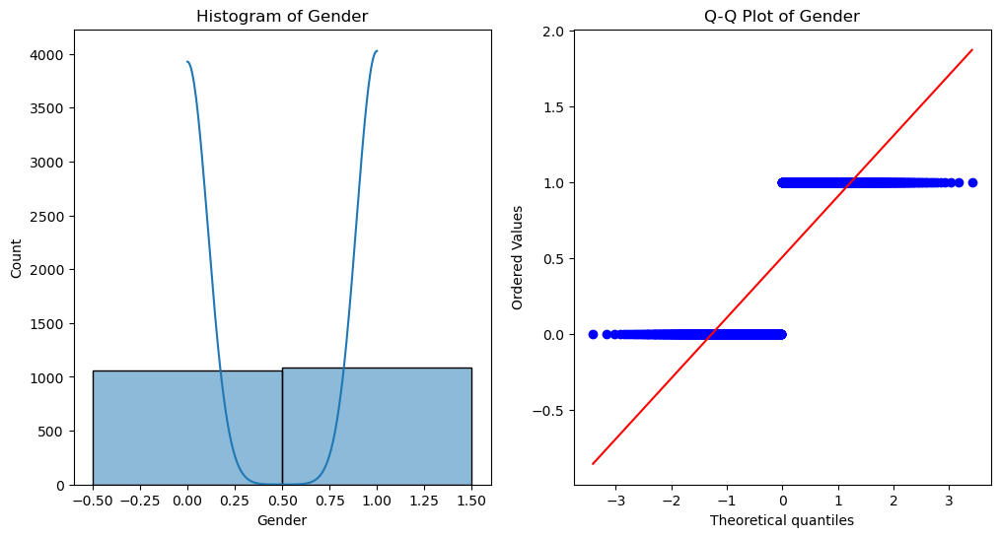

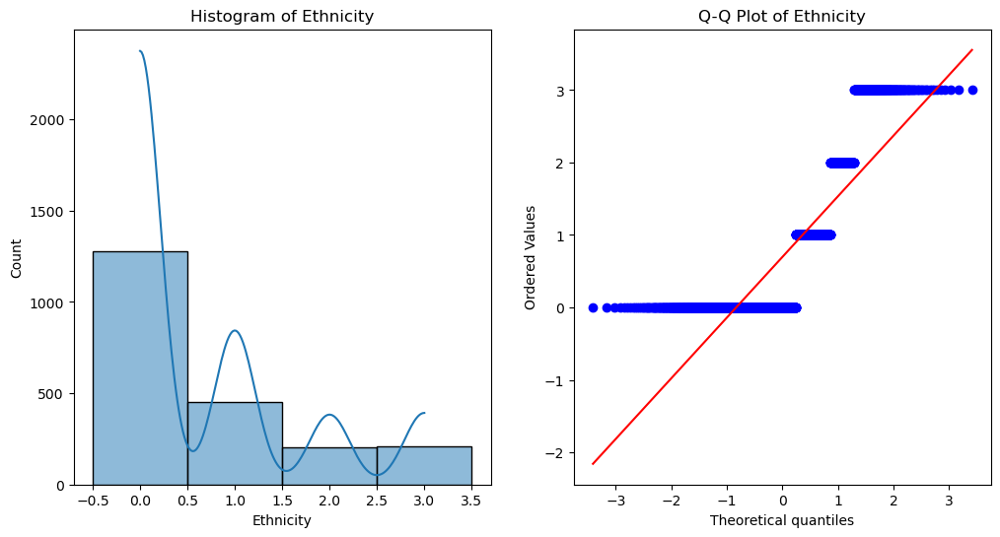

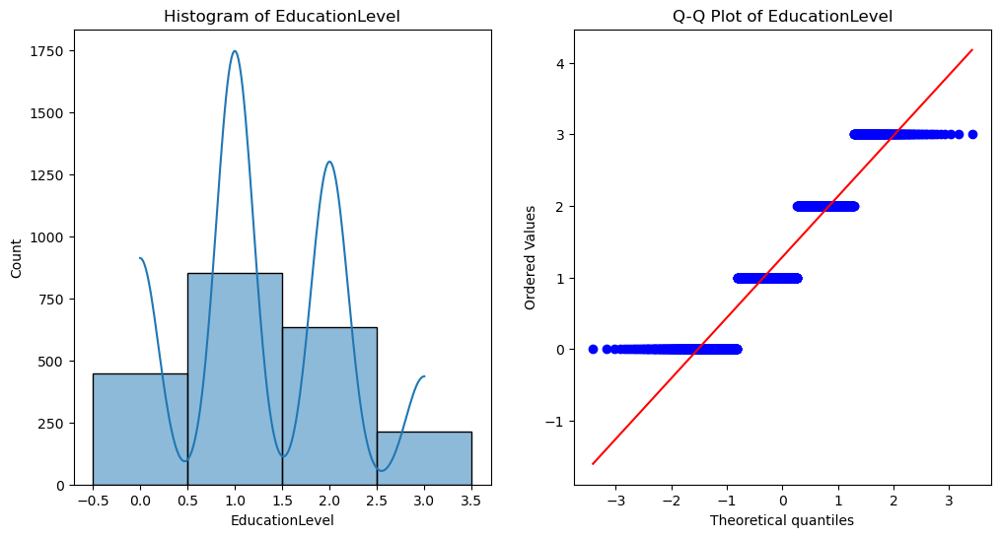

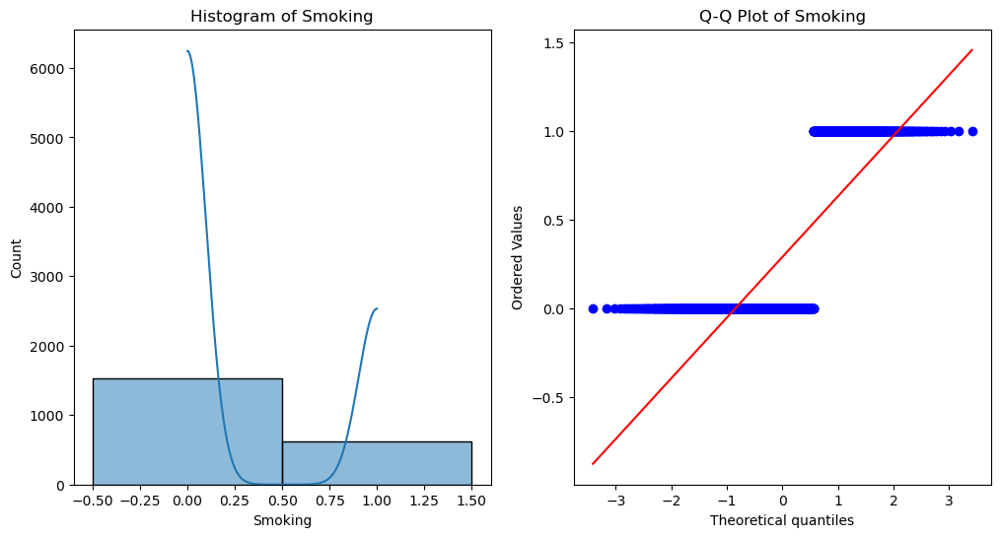

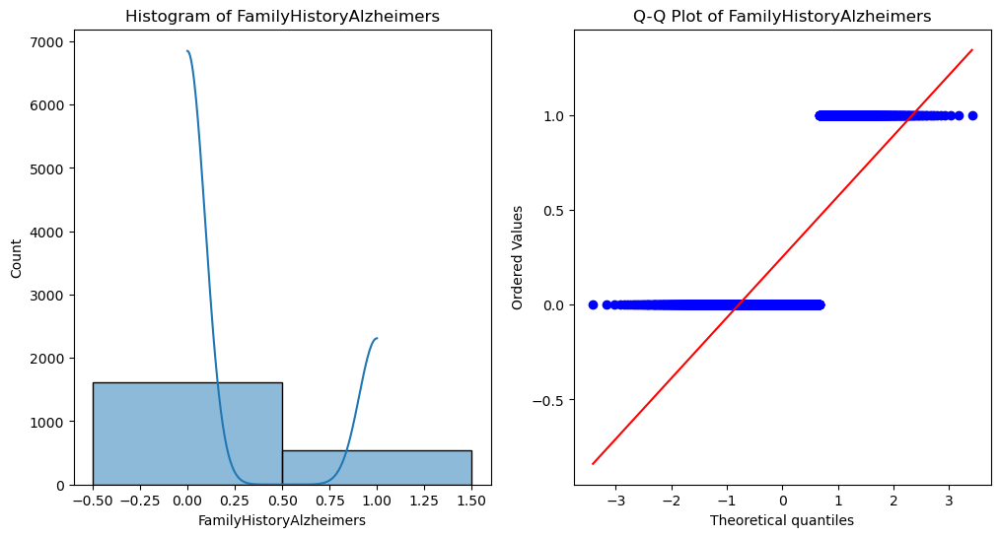

...

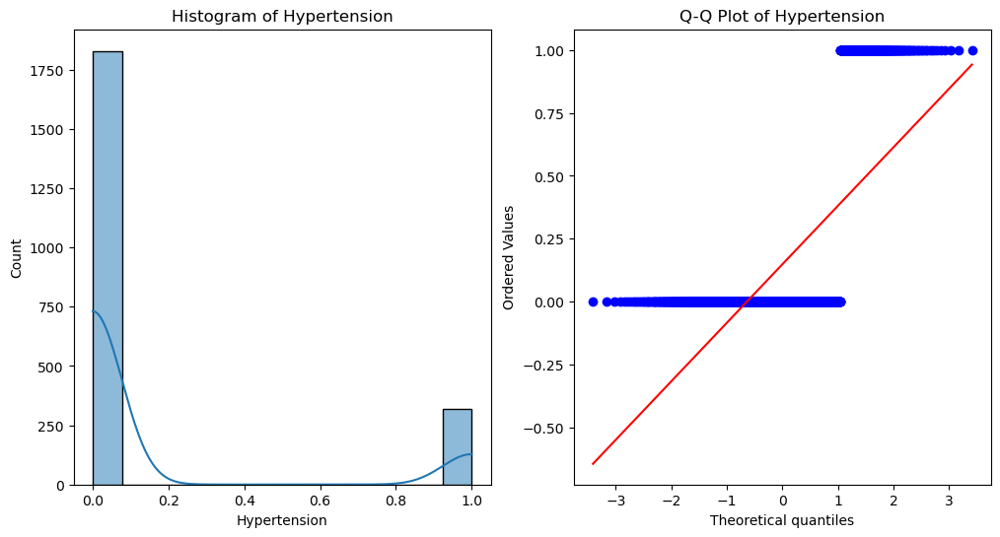

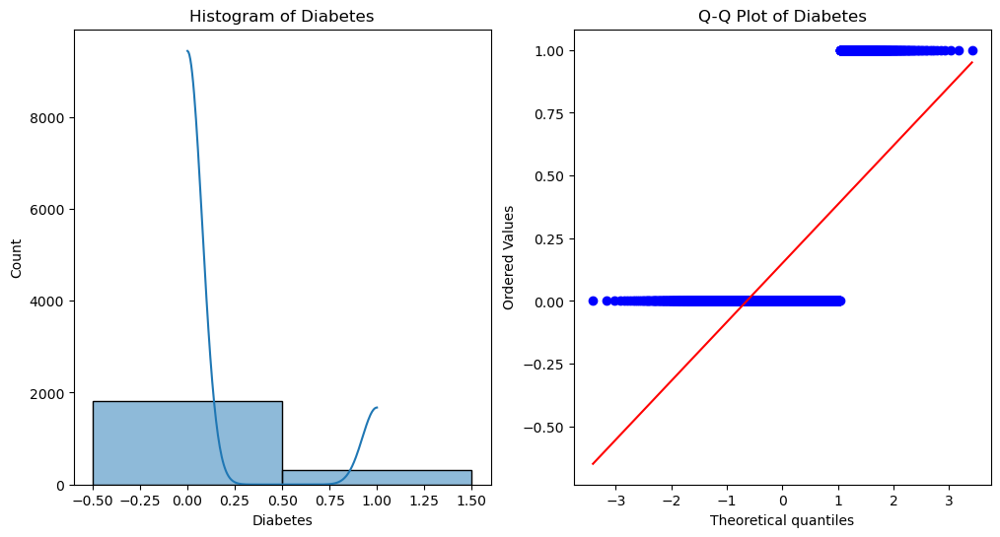

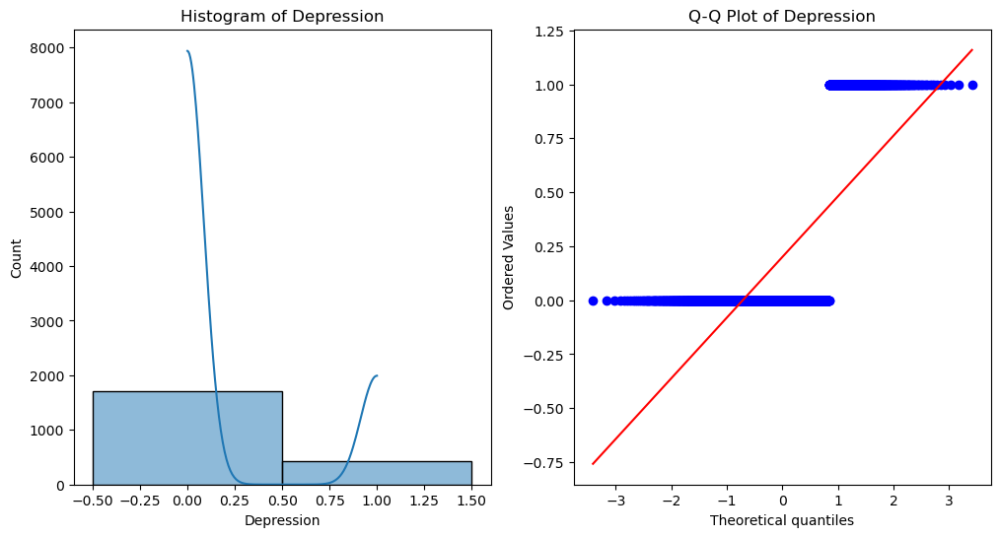

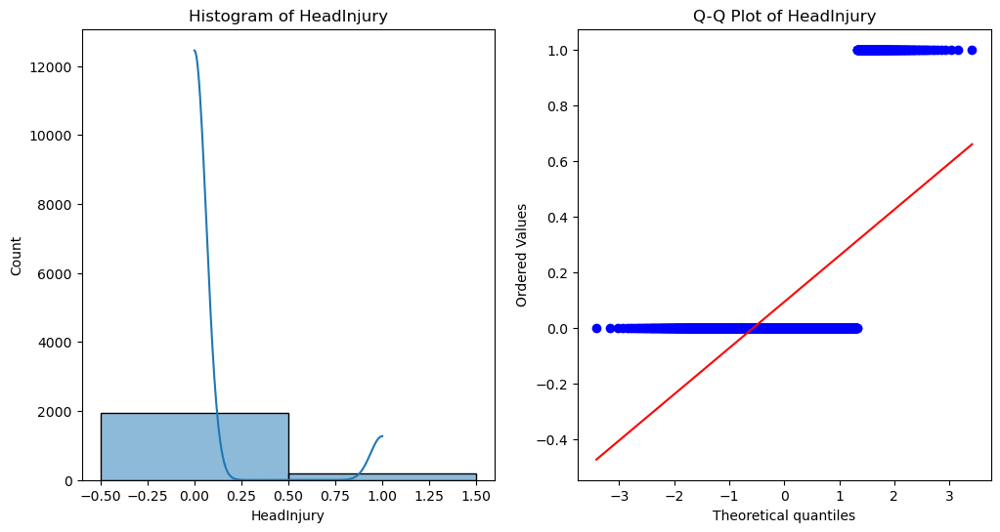

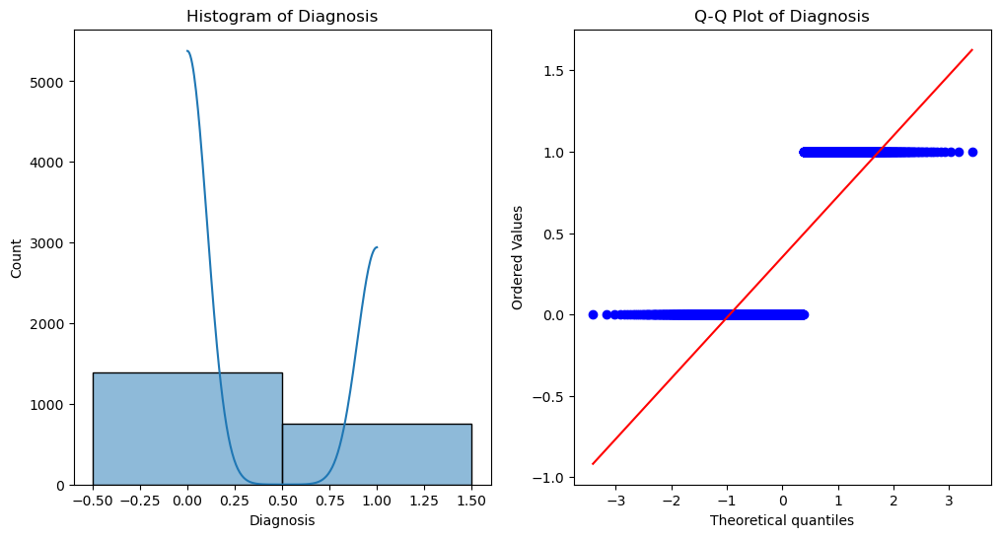

In [257]:
#checked for normality of categorical data

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

for var in categorical_data_23_columns:
    data_var = categorical_data_23[var].dropna()
    
    # Histogram
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(data_var, kde=True)
    plt.title(f'Histogram of {var}')
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data_var, dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {var}')
    
    plt.show()


Variable: Gender
Chi2: 0.8597155201269622
p-value: 0.35381831348465786
Degrees of Freedom: 1
-----------------------------------


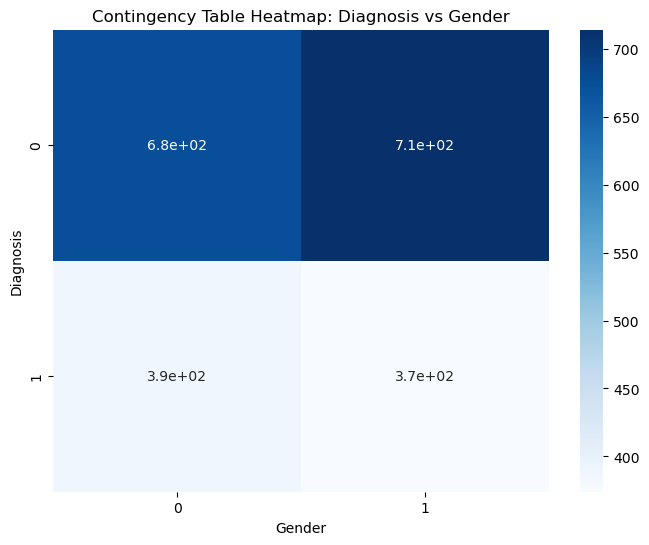

Variable: Ethnicity
Chi2: 6.302088590572339
p-value: 0.09780307184026778
Degrees of Freedom: 3
-----------------------------------


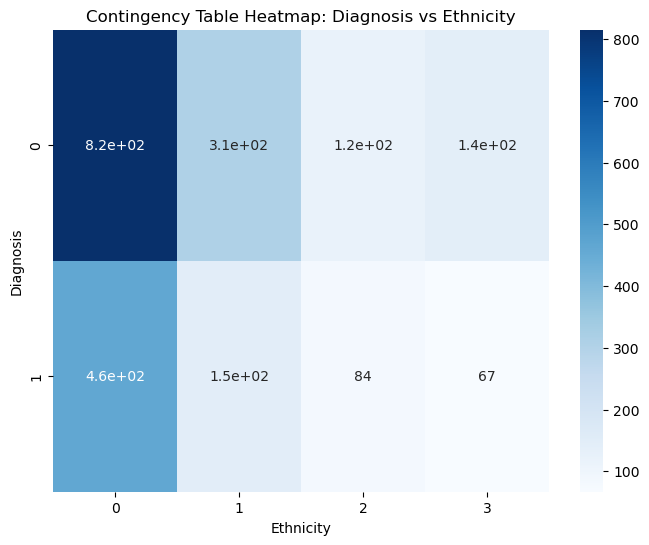

Variable: EducationLevel
Chi2: 4.453147172785709
p-value: 0.2165077197332475
Degrees of Freedom: 3
-----------------------------------


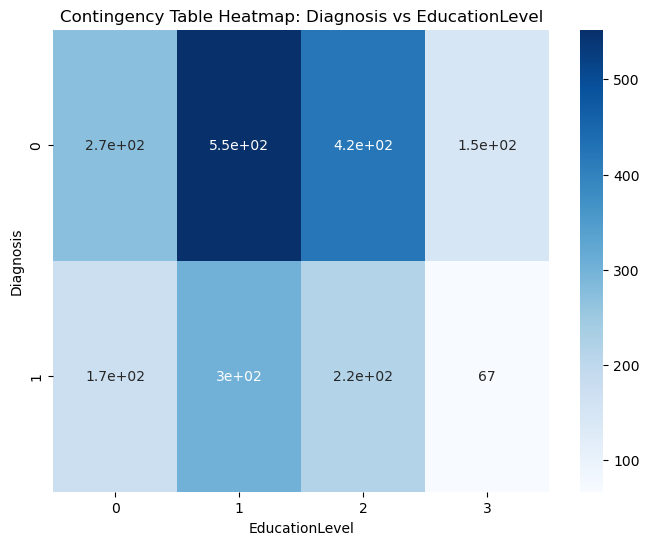

Variable: Smoking
Chi2: 0.030886776214044256
p-value: 0.860493227376371
Degrees of Freedom: 1
-----------------------------------


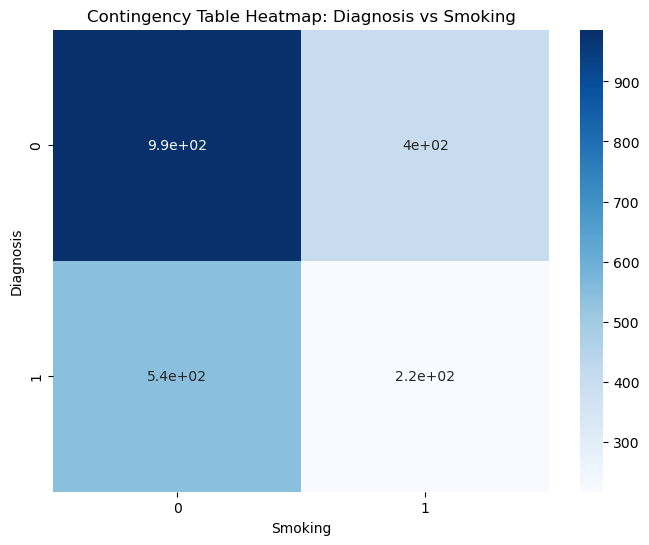

Variable: FamilyHistoryAlzheimers
Chi2: 2.170309071104257
p-value: 0.14069795394928386
Degrees of Freedom: 1
-----------------------------------


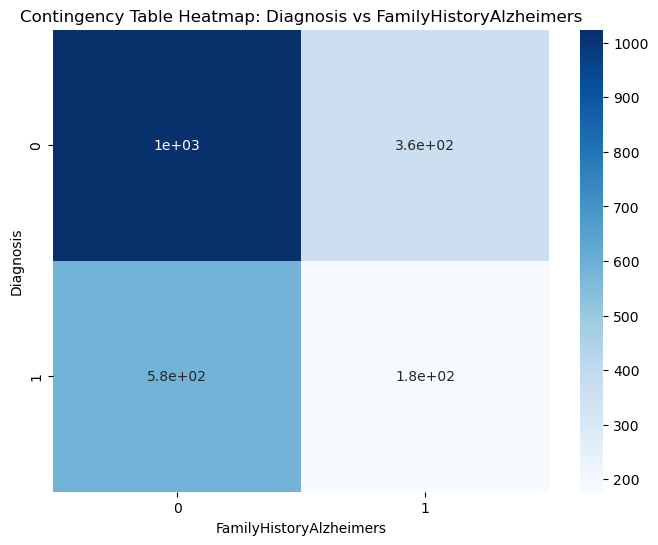

Variable: CardiovascularDisease
Chi2: 1.9476831277338071
p-value: 0.1628367346921118
Degrees of Freedom: 1
-----------------------------------


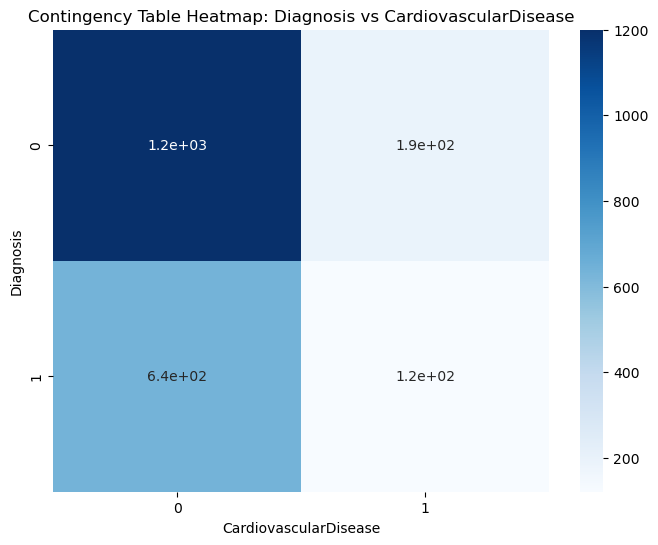

Variable: Hypertension
Chi2: 2.4424869552087958
p-value: 0.11808887156379344
Degrees of Freedom: 1
-----------------------------------


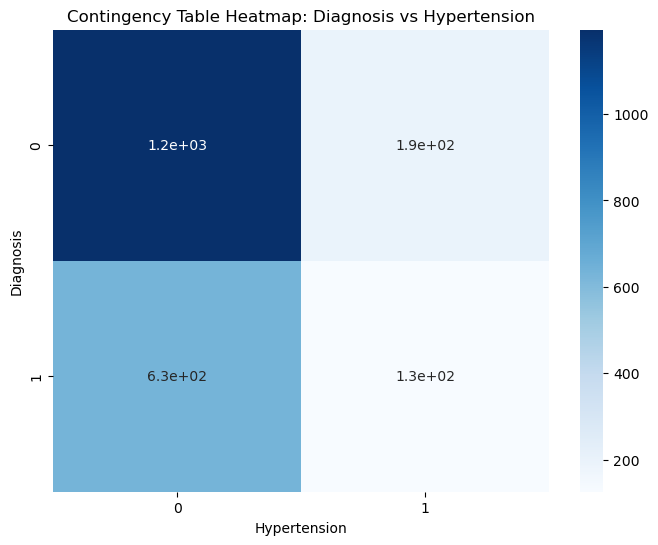

Variable: Diabetes
Chi2: 1.9531766063941984
p-value: 0.16224495200138433
Degrees of Freedom: 1
-----------------------------------


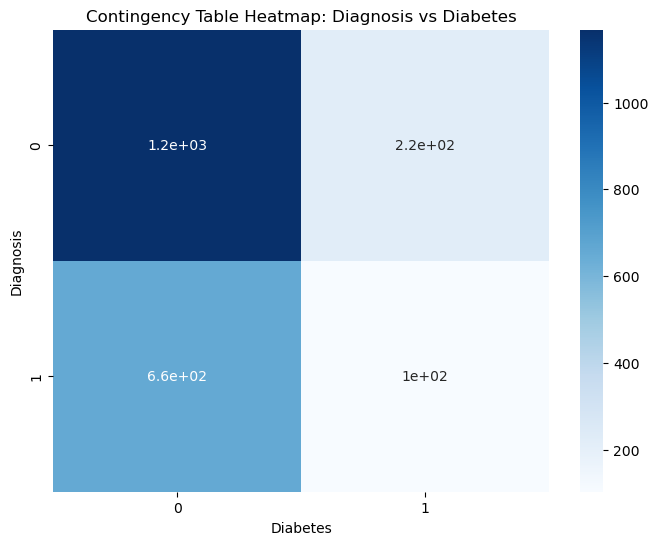

Variable: Depression
Chi2: 0.04701930420760714
p-value: 0.8283335436917469
Degrees of Freedom: 1
-----------------------------------


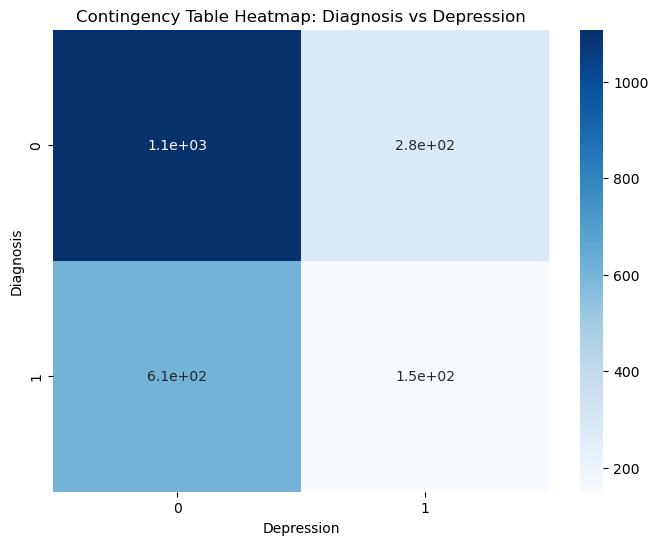

Variable: HeadInjury
Chi2: 0.836768271283602
p-value: 0.3603226855585838
Degrees of Freedom: 1
-----------------------------------


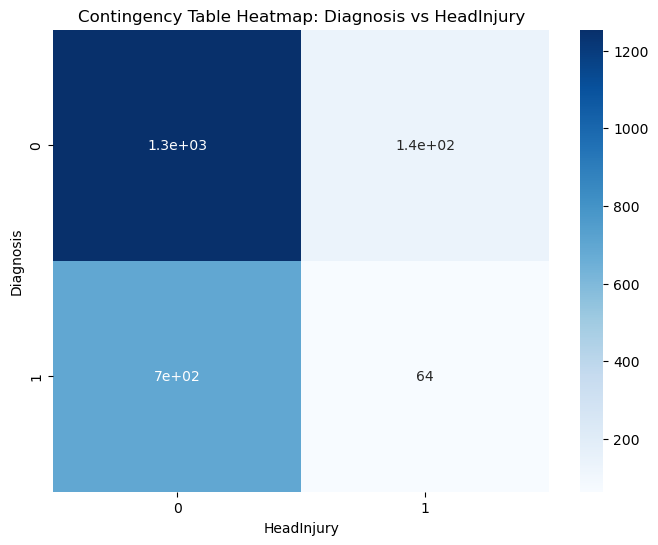

Variable: Diagnosis
Chi2: 2144.6274386673003
p-value: 0.0
Degrees of Freedom: 1
-----------------------------------


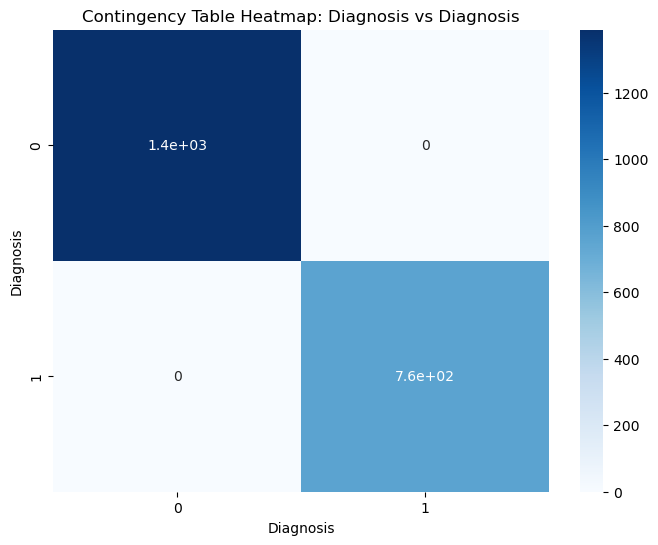

In [69]:
# Performed Chi square test on categorical data to check correlation between variables and diagnosis 
from scipy.stats import chi2_contingency

variables = categorical_data_23

for var in variables:
    contingency_table = pd.crosstab(variables['Diagnosis'], variables[var])
    chi2, p, dof, ex = chi2_contingency(contingency_table)


    print(f'Variable: {var}')
    print(f'Chi2: {chi2}')
    print(f'p-value: {p}')
    print(f'Degrees of Freedom: {dof}')
   

#Visualise the contingency table with a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(contingency_table, annot=True, cmap='Blues')
    plt.title(f'Contingency Table Heatmap: Diagnosis vs {var}')
    plt.show()

In [241]:
#organised continuous data and categorical data variables to do statistics 

#continuous data 
continuous_data_23_columns = ['Age','BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'SystolicBP','DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL','CholesterolTriglycerides']

#diagnosis (categorical data)
diagnosis_categotical_data = ['Diagnosis']

# Create a new DataFrame with only those columns
continuous_data_23 = data_23[continuous_data_23_columns]
diagnosis_data = data_23[diagnosis_categotical_data]

In [249]:
# Perform Shapiro-Wilk test for normality check
for var in continuous_data_23_columns:
    data_var = continuous_data_23[var].dropna()
    
    if len(data_var) > 3:  # Shapiro-Wilk requires at least 3 data points
        stat, p_value = shapiro(data_col)
        print(f'Variable: {var}')
        print(f'Statistic: {stat:.4f}, p-value: {p_value:.4f}')
        
        if p_value > 0.05:
            print('Data is normally distributed (fail to reject H0)')
        else:
            print('Data is not normally distributed (reject H0)')
        print('---')
 

Variable: Age
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: BMI
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: AlcoholConsumption
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: PhysicalActivity
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: DietQuality
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: SleepQuality
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: SystolicBP
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: DiastolicBP
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: CholesterolTotal
Statistic: 0.9523, p-value: 0.0000
Data is not normally distributed (reject H0)
---
Variable: CholesterolLDL
Statistic: 0.9523, p

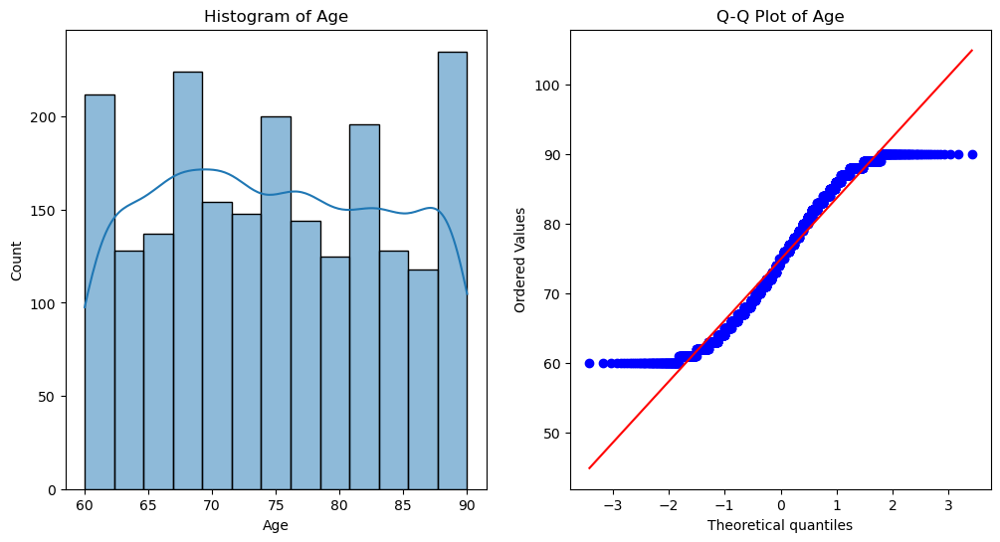

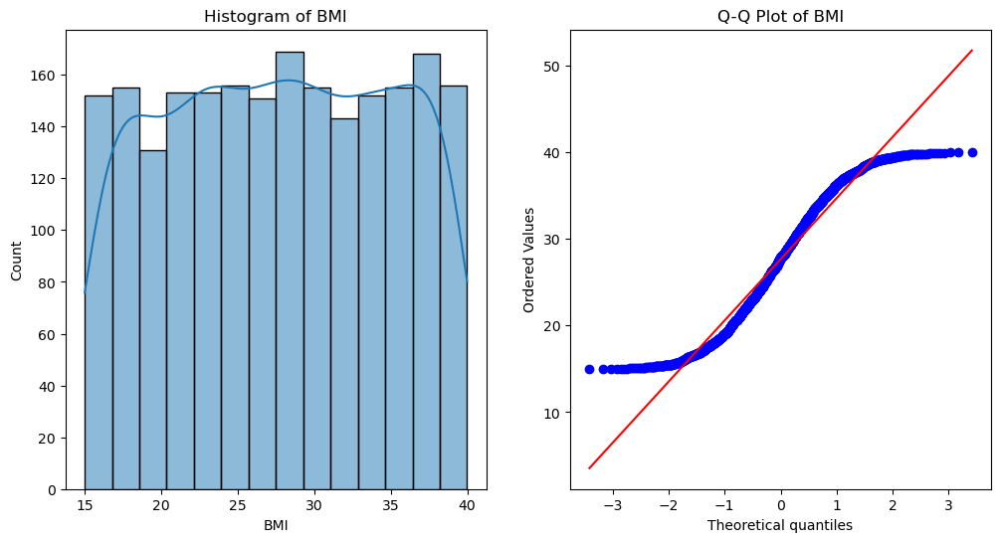

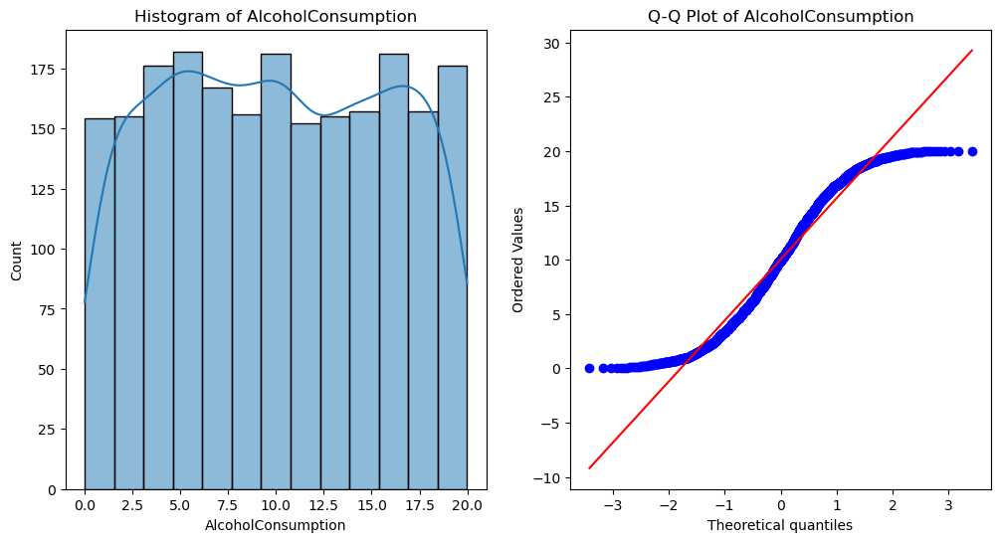

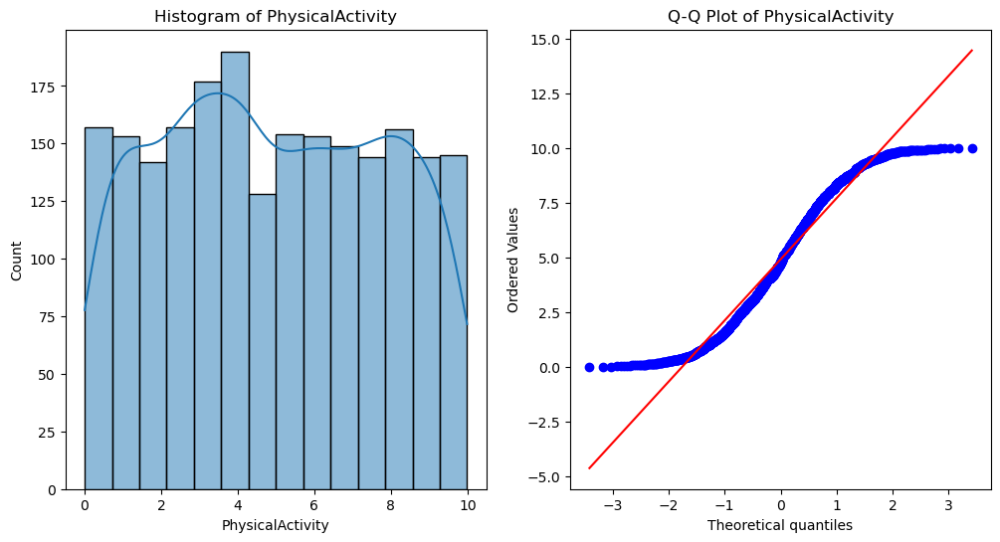

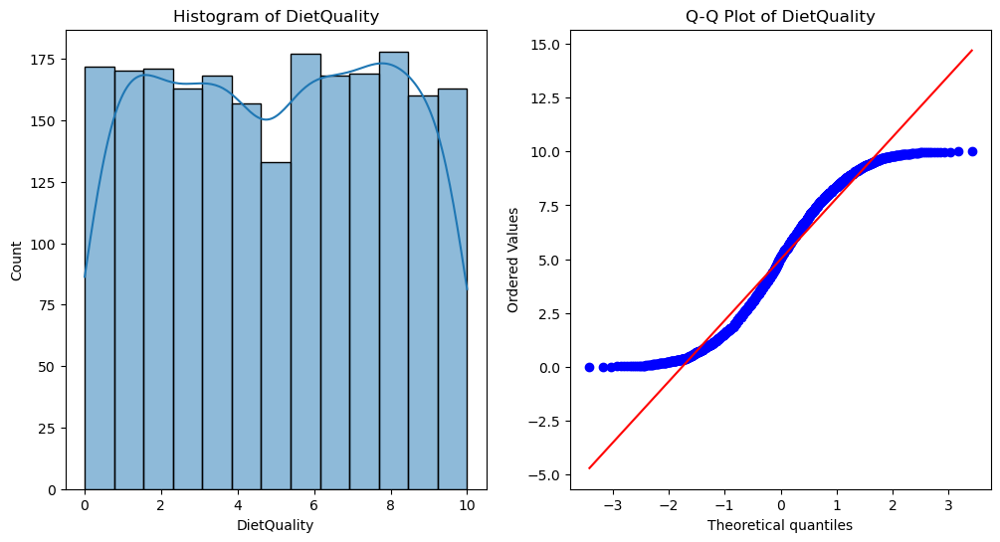

...

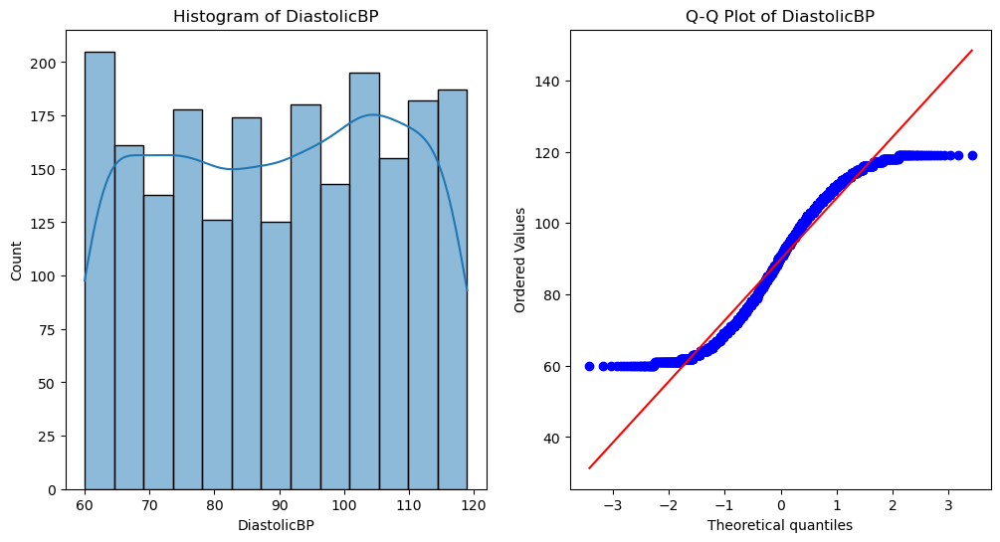

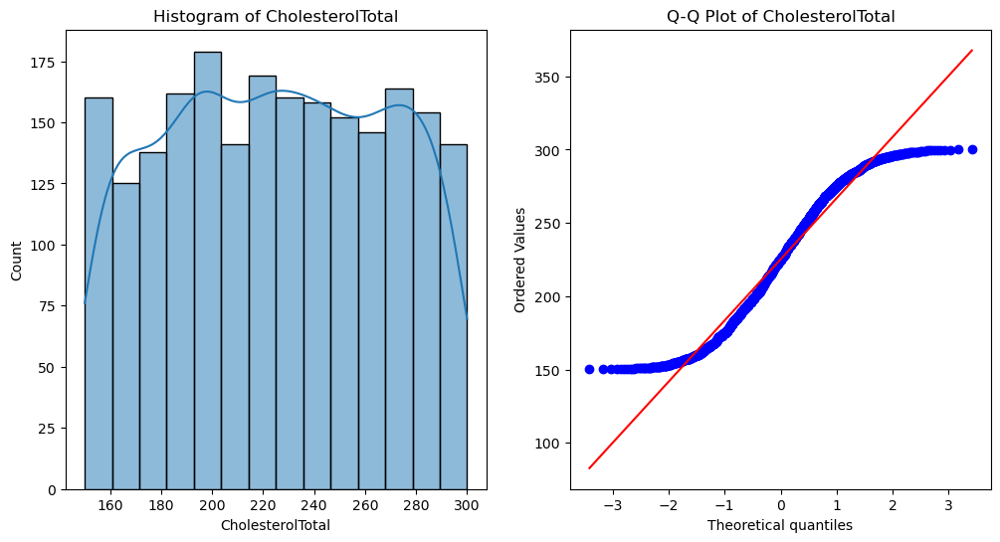

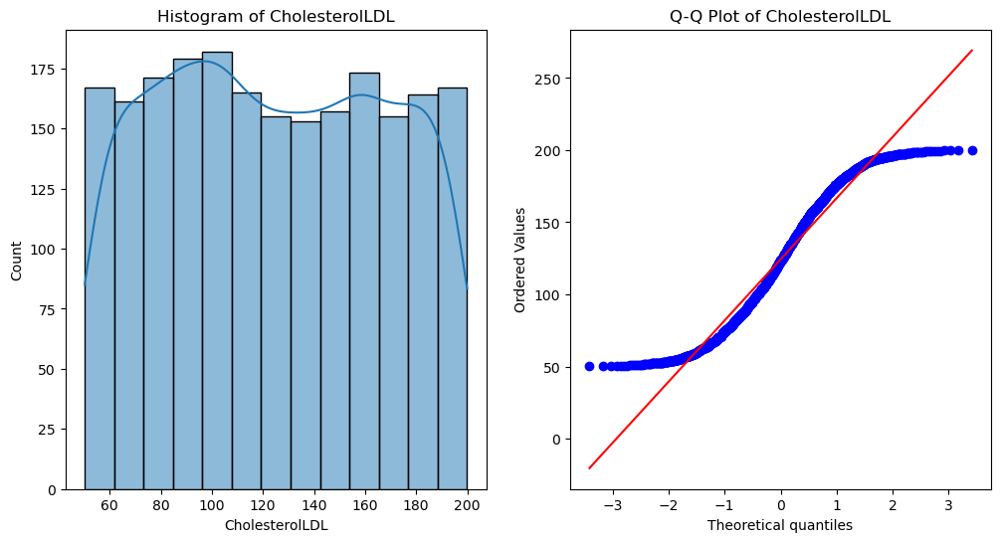

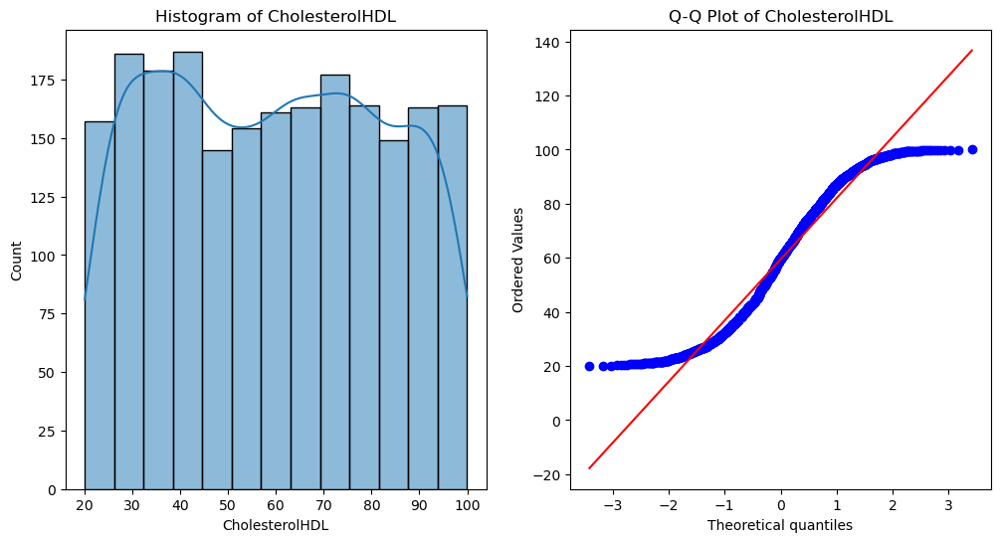

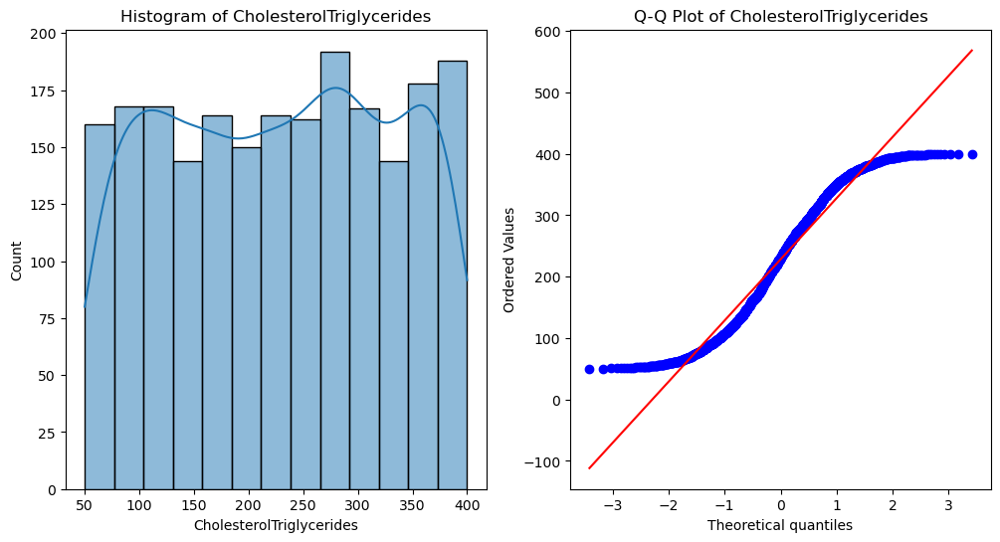

In [255]:
#double checked notmallity using Histogram and Q-Q Plot

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

for var in continuous_data_23_columns:
    data_var = continuous_data_23[var].dropna()
    
    # Histogram
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(data_var, kde=True)
    plt.title(f'Histogram of {var}')
    
    # Q-Q Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data_var, dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {var}')
    
    plt.show()


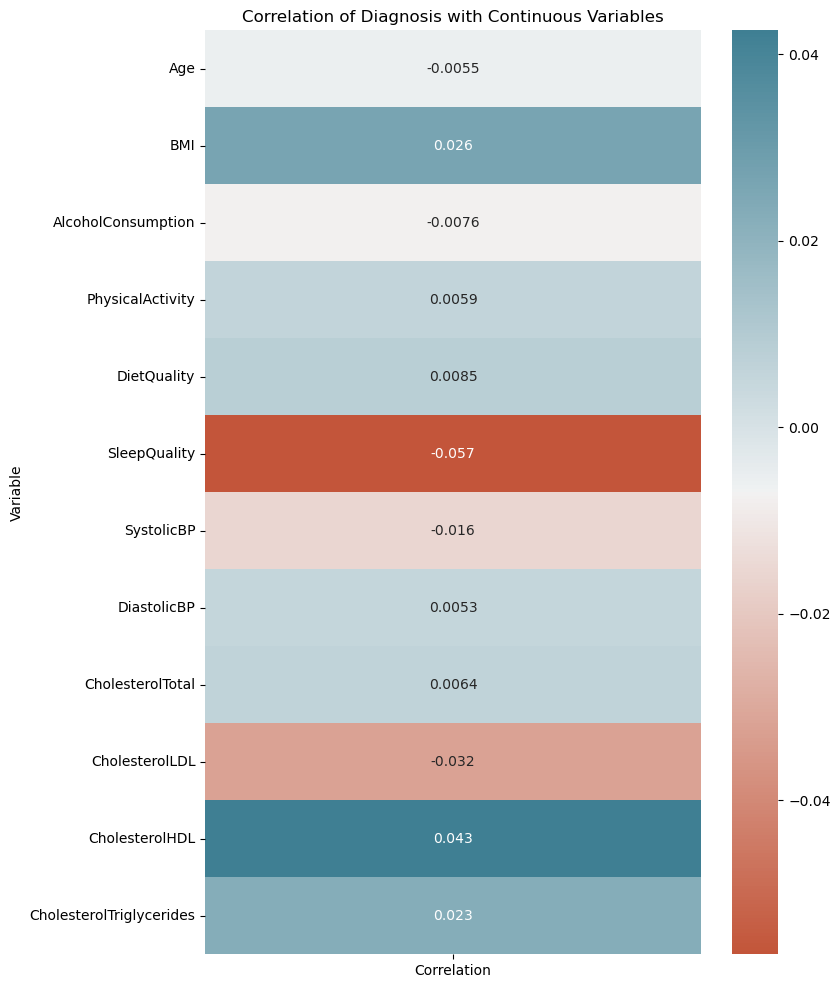

In [233]:
# Test correlation between continous variables and diagnosis. Test used Point biserial correlation --> https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.pointbiserialr.html
from scipy import stats

a = np.array(diagnosis_data).flatten()  # used flatten() to make 1D array 
continuous_variables = pd.DataFrame(continuous_data_23)

# Calculate point-biserial correlation for each continuous variable, so this loop iterates over each column
for column in continuous_variables.columns:
    continuous_variable = continuous_variables[column].values.flatten() # make sure that all the columns values returns 1D array
    corr_coefficient, _ = stats.pointbiserialr(a, continuous_variable) # the test, added _ as a throwaway variable cause the test restuls will give the corr coefficient and the p values results
    correlations[column] = corr_coefficient  # Store the correlation coefficient

# Convert the correlations to a DataFrame
correlation = pd.DataFrame(list(correlations.items()), columns=['Variable', 'Correlation'])
correlation.set_index('Variable', inplace=True)

# Set up the matplotlib figure
plt.figure(figsize=(8, 12))
sns.heatmap(correlation,
            annot=True, annot_kws={'fontsize':10},
            cmap=sns.diverging_palette(20, 220, as_cmap=True),
            cbar=True)

plt.title('Correlation of Diagnosis with Continuous Variables')
plt.show()



In [27]:
# used Pearson corr test
data_23.corr()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,...,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,Diagnosis
Age,1.000000,0.028708,0.027745,-0.060560,-0.015677,0.020060,0.007323,-0.010249,-0.023386,0.049139,...,-0.008752,-0.040337,0.003954,-0.005324,-0.004462,0.000392,0.003588,0.006803,-0.003062,-0.005488
Gender,0.028708,1.000000,-0.003660,-0.007070,0.005928,0.016650,0.004330,-0.035795,0.010942,0.007310,...,0.018113,0.004013,-0.002641,0.011657,-0.026059,-0.009568,0.016271,-0.005846,-0.012427,-0.020975
Ethnicity,0.027745,-0.003660,1.000000,0.026516,-0.003176,0.031485,0.008363,0.020498,-0.018184,0.029304,...,-0.005411,-0.009364,0.012848,-0.027086,0.010310,-0.011757,0.007907,-0.021828,-0.007173,-0.014782
EducationLevel,-0.060560,-0.007070,0.026516,1.000000,-0.023514,-0.009904,-0.012646,-0.016703,0.017412,0.020248,...,0.027573,-0.008951,-0.016950,-0.016782,-0.002553,-0.041598,0.050504,-0.008125,-0.025763,-0.043966
BMI,-0.015677,0.005928,-0.003176,-0.023514,1.000000,0.020437,-0.008997,0.000742,0.019922,-0.005975,...,-0.012507,0.016288,0.004928,-0.019275,-0.002524,0.001082,0.023684,0.038605,-0.018001,0.026343
Smoking,0.020060,0.016650,0.031485,-0.009904,0.020437,1.000000,0.008363,0.010760,-0.002048,-0.001145,...,-0.039363,-0.019178,-0.021124,-0.024116,-0.014112,-0.010907,-0.007393,-0.025567,-0.021058,-0.004865
AlcoholConsumption,0.007323,0.004330,0.008363,-0.012646,-0.008997,0.008363,1.000000,0.021696,0.020117,-0.003873,...,0.008867,-0.008301,-0.006010,-0.030070,-0.008909,-0.033944,-0.017042,-0.001925,0.023362,-0.007618
PhysicalActivity,-0.010249,-0.035795,0.020498,-0.016703,0.000742,0.010760,0.021696,1.000000,0.011085,-0.001823,...,-0.013533,0.025780,0.022081,-0.004811,-0.010555,0.014335,0.017789,-0.001993,0.027416,0.005945
DietQuality,-0.023386,0.010942,-0.018184,0.017412,0.019922,-0.002048,0.020117,0.011085,1.000000,0.051295,...,-0.002516,-0.008163,-0.043628,0.006031,0.009539,-0.016790,-0.023698,-0.008659,0.034734,0.008506
SleepQuality,0.049139,0.007310,0.029304,0.020248,-0.005975,-0.001145,-0.003873,-0.001823,0.051295,1.000000,...,-0.022996,-0.004546,0.038668,-0.027887,0.010797,0.006879,0.006751,0.015453,0.024004,-0.056548


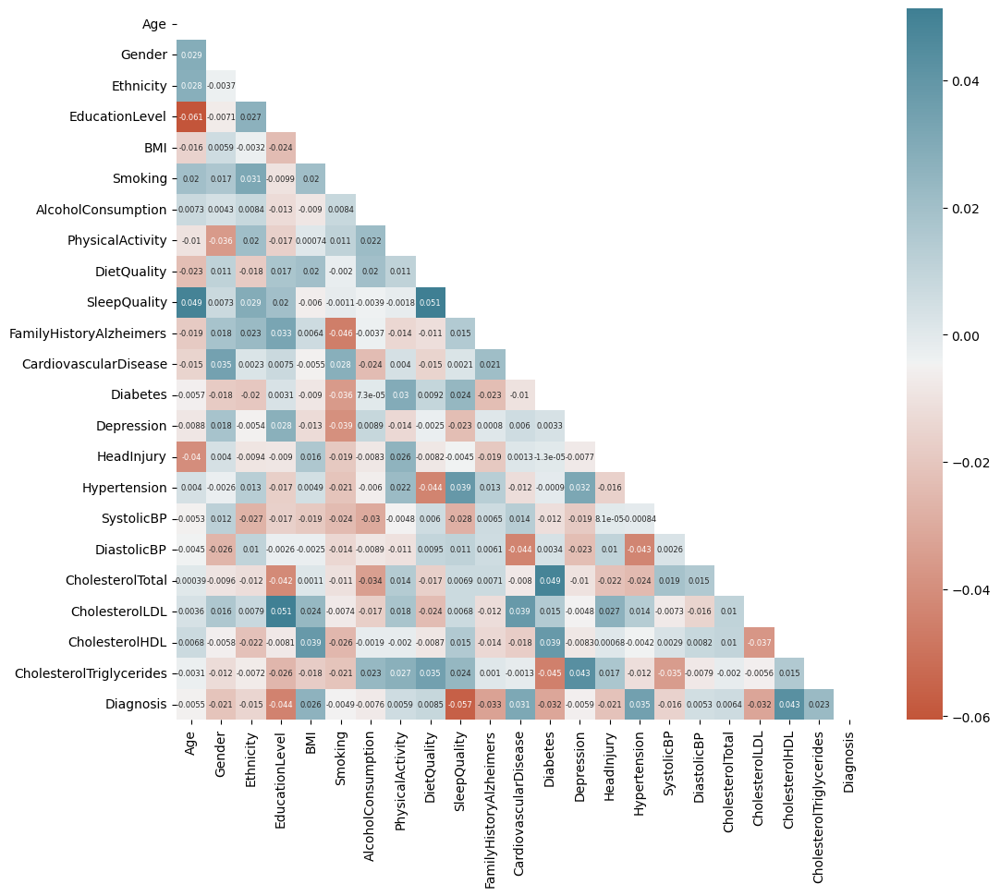

In [201]:
# In this case I experimented using Pearson corr test with all the vartiables and generated correlation heatmap
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np 


corrmat = data_23.corr()
# Create a mask for the upper triangle for better reading
mask = np.zeros_like(corrmat)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(12, 10)) 
sns.heatmap(corrmat,
            annot=True, annot_kws={'fontsize':6},
            mask=mask,
            cmap=sns.diverging_palette(20, 220, as_cmap=True))

plt.show()


#### TO Dos for data cleaning / exploration

* Tidy up sections in this notebook
* Make plots ready for including in final report (titles, x and y labels etc); use seaborn!
* Investigate Hypertension outliers (we need to figure out what the value actually is and whether the outliers are meaningful)
* Check categorical variables only have expected values (check against Kaggle info)
* Look at how features relate (e.g., heatmap; https://seaborn.pydata.org/generated/seaborn.heatmap.html)


### Saving clean data to a new file
When finished with cleaning and exploration, save out datasets.

In [33]:
# Save clean datasets to deriv folder
data_23.to_csv('deriv/alzheimers_disease_data_23_clean.csv', index=None)
data_9.to_csv('deriv/alzheimers_disease_data_9_clean.csv', index=None)


OSError: Cannot save file into a non-existent directory: 'deriv'